# Library

In [3]:
import pandas as pd
import numpy as np
import gzip
import sys
sys.path.append('../../../Util')
import BERTopicUtils as btu
from llama_cpp import Llama
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from bertopic.representation import MaximalMarginalRelevance, KeyBERTInspired
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
import hdbscan
from bertopic.vectorizers import ClassTfidfTransformer
from transformers import pipeline
import torch

## 5° Baseline Summary: Specific Topics

### Clustering Approach

- **Parameter Setting**:
  - Embedding Model: all-MiniLM-L6-v2
  - Representation Model: keyBERTInspired, MaximalMarginalRelevance
  - Count Vectorizer
  - CtfIDF
  - UMAP: 150 neighbors, 10 components
  - HDBSCAN: 150 min cluster size
  - Zero-Shot Classification on cluster name
  - Outliers-reduction with Probabilites: 0.075 threshold

### Clustering Results

- **Clusters Retrieved**: 31 in which the most important ones concern:
  1. Socialism
  2. Elections Fraud America
  3. Racism Mexico
  4. Israel War
  5. Elections Europe
  6. Deep State
  7. Trump
  8. Climate Change
  9. White Racism
  10. Coronavirus
  11. Big Tech
  12. Religion


- **Performance Metrics**:
  - **Silhouette Score**: 0.60
  - **Davies-Bouldin Score**: 0.55
  - **Coherence-Score**: 0.46
  - **Dos Score**: 0.2
  - **%Outliers**: 0.32 (16.8k/52.3k)

# Process Data

In [78]:
df = btu.load_data_filtered('../../../Datasets/CleanedData/posts_white_nation_cleaned_content_created_preprocessed.csv', 'content')

52310


In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")
model = SentenceTransformer('all-MiniLM-L6-v2', device=device)

Using device: cpu


In [ ]:
corpus = df['content'].tolist()
corpus = list(set(corpus))
embeddings = model.encode(corpus, batch_size=64, show_progress_bar=True)

In [ ]:
'''
np.savez_compressed('PreProcessFiles/content_preprocessed_embeddings_white_nation.npz', embeddings)
with gzip.open('PreProcessFiles/content_preprocessed_corpus_white_nation.txt.gz', 'wt') as f:
    for word in corpus:
        f.write(word + '\n')
'''

In [5]:
with np.load('PreProcessFiles/content_preprocessed_embeddings_white_nation.npz') as data:
    embeddings = data['arr_0']

with gzip.open('PreProcessFiles/content_preprocessed_corpus_white_nation.txt.gz', 'rt') as f:
    corpus = f.read().split('\n')

corpus.pop()

''

# Train Model

In [50]:
mmr = MaximalMarginalRelevance(diversity=0.3)
kw = KeyBERTInspired()
vectorizer_model = CountVectorizer(stop_words="english")
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
umap_model = UMAP(n_neighbors=150, n_components=10, min_dist=0.0, metric='cosine', random_state=42)
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=150, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

topic_model = BERTopic(
    nr_topics=32,
    top_n_words=10, 
    n_gram_range=(1, 3),
    umap_model=umap_model, 
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model, 
    ctfidf_model=ctfidf_model, 
    representation_model=[mmr, kw],
    embedding_model=model,
    calculate_probabilities=True,
    verbose=True
)

topics, probs = topic_model.fit_transform(corpus, embeddings)

2024-08-01 17:54:21,224 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-01 18:01:28,421 - BERTopic - Dimensionality - Completed ✓
2024-08-01 18:01:28,582 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-01 18:02:14,513 - BERTopic - Cluster - Completed ✓
2024-08-01 18:02:14,544 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-01 18:02:40,518 - BERTopic - Representation - Completed ✓
2024-08-01 18:02:40,526 - BERTopic - Topic reduction - Reducing number of topics
2024-08-01 18:03:01,096 - BERTopic - Topic reduction - Reduced number of topics from 35 to 32


In [51]:
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 5))
topic_model.update_topics(corpus, vectorizer_model=vectorizer_model)
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,23147,-1_trump_new_video_state,"[trump, new, video, state, president, report, ...",[Jim Hoft The Gateway Pundit Former Trump camp...
1,0,10136,0_socialism_lesson_lesson applied socialism_ap...,"[socialism, lesson, lesson applied socialism, ...",[Re A Practical Lesson Applied Socialism The H...
2,1,2106,1_trump_democrats_pelosi_biden,"[trump, democrats, pelosi, biden, impeachment,...",[Chris Menahan Information Liberation Joe Bide...
3,2,1799,2_border_illegal_wall_trump,"[border, illegal, wall, trump, mexico, immigra...",[Joe Biden planning dismantle legal wall Unite...
4,3,1211,3_israel_syria_iran_israeli,"[israel, syria, iran, israeli, trump, war, rus...",[Netanyahu Killing Gaza protesters wise decisi...
5,4,1184,4_brexit_eu_farage_europe,"[brexit, eu, farage, europe, yellow, merkel, m...",[Salvini Backs Yellow Vests Against Macron Cla...
6,5,1062,5_thread_pictures_pictures thread_funny,"[thread, pictures, pictures thread, funny, kno...","[Re Funny Pictures Thread rioters, Re Funny Pi..."
7,6,914,6_climate_climate change_change_warming,"[climate, climate change, change, warming, glo...","[YET ANOTHER CLIMATE CHANGE, Matt Agorist The ..."
8,7,893,7_market_fed_bank_banks,"[market, fed, bank, banks, global, money, cent...",[The Money GPS The post IMF World Bank Prepare...
9,8,814,8_sgt_sgt report_report_appeared sgt report,"[sgt, sgt report, report, appeared sgt report,...",[Mark Dice loaded It Happening The post It Hap...


# Evaluation

In [52]:
umap_embeddings = topic_model.umap_model.fit_transform(embeddings)

In [53]:
sihouette_davies_score = btu.calculate_silhouette_davies(umap_embeddings, topics)
coherence_score = btu.evaluate_topic_coherence(topic_model.get_topics(), corpus)
dos_score = btu.calculate_dos(topic_model.get_topics())

Silhouette Score: 0.6501653790473938
Davies-Bouldin Score: 0.44627586887269444
Coherence Model: 0.45521361345129496
Distinta Overlap Score: 0.10685483870967742


In [61]:
new_topics = topic_model.reduce_outliers(corpus, topics, strategy="probabilities", probabilities=probs, threshold=0.075)
topic_model.update_topics(corpus, topics=new_topics)
topic_model.get_topic_info()

2024-08-01 18:19:58,009 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


,Topic,Count,Name,Representation,Representative_Docs
0,-1,16801,-1_the_trump_to_of,"[the, trump, to, of, in, new, is, us, re, video]",[Jim Hoft The Gateway Pundit Former Trump camp...
1,0,10136,0_socialism_lesson_applied socialism_practical,"[socialism, lesson, applied socialism, practic...",[Re A Practical Lesson Applied Socialism The H...
2,1,2606,1_trump_democrats_pelosi_biden,"[trump, democrats, pelosi, biden, election, im...",[Chris Menahan Information Liberation Joe Bide...
3,2,1802,2_border_illegal_wall_trump,"[border, illegal, wall, trump, mexico, immigra...",[Joe Biden planning dismantle legal wall Unite...
4,3,1740,3_israel_iran_syria_us,"[israel, iran, syria, us, israeli, trump, war,...",[Netanyahu Killing Gaza protesters wise decisi...
5,4,1184,4_brexit_eu_farage_europe,"[brexit, eu, farage, europe, yellow, merkel, m...",[Salvini Backs Yellow Vests Against Macron Cla...
6,5,1067,5_thread_re_you_pictures,"[thread, re, you, pictures, pictures thread, f...","[Re Funny Pictures Thread rioters, Re Funny Pi..."
7,6,915,6_climate_climate change_change_warming,"[climate, climate change, change, warming, glo...","[YET ANOTHER CLIMATE CHANGE, Matt Agorist The ..."
8,7,1227,7_the_fed_market_bank,"[the, fed, market, bank, banks, global, financ...",[The Money GPS The post IMF World Bank Prepare...
9,8,832,8_sgt_sgt report_report_appeared first,"[sgt, sgt report, report, appeared first, appe...",[Mark Dice loaded It Happening The post It Hap...


In [62]:
sihouette_davies_score = btu.calculate_silhouette_davies(umap_embeddings, new_topics)
coherence_score = btu.evaluate_topic_coherence(topic_model.get_topics(), corpus)
dos_score = btu.calculate_dos(topic_model.get_topics())

Silhouette Score: 0.5842010974884033
Davies-Bouldin Score: 0.5458231433725081
Coherence Model: 0.45644951350297375
Distinta Overlap Score: 0.1975806451612903


In [63]:
topic_model.visualize_topics()

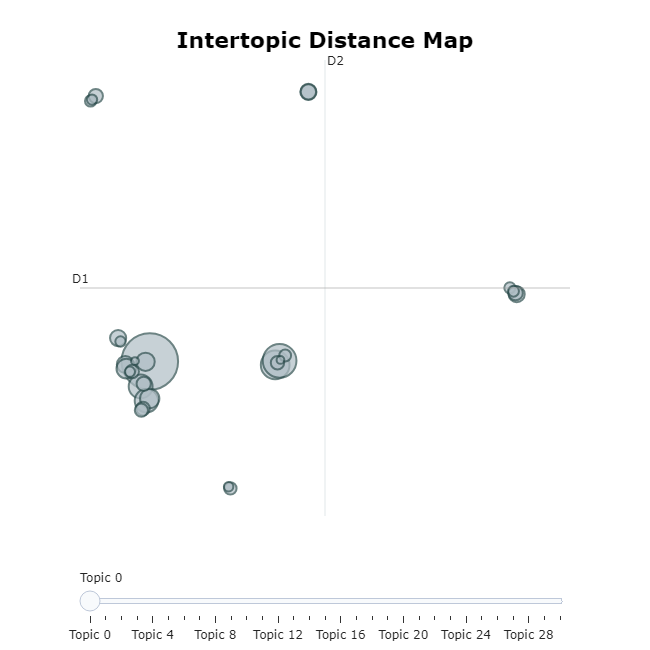

In [ ]:
reduced_embeddings = UMAP(n_neighbors=150, n_components=2, 
                          min_dist=0.0, metric='cosine').fit_transform(embeddings)

In [7]:
topic_model.visualize_documents(corpus, reduced_embeddings=reduced_embeddings, 
                                hide_document_hover=True, hide_annotations=True)

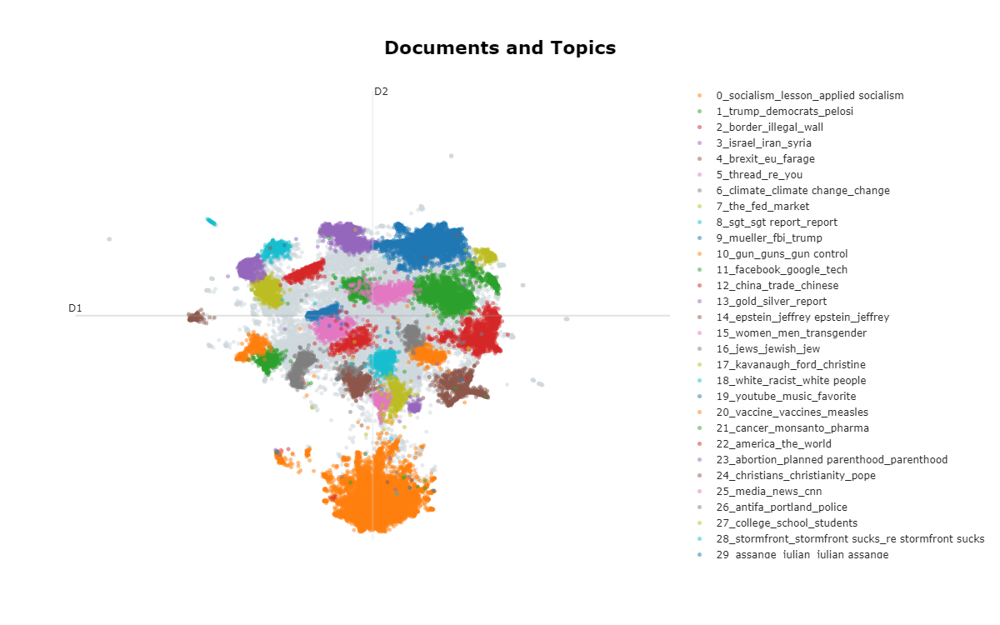

# Zero-Shot Classification

In [65]:
classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli")

In [67]:
zero_shot_topics = pd.read_csv('../../../Datasets/IntentCrime/intent_crime.csv')['intent'].tolist()
dict_zero_shots_25 = btu.assign_labels_to_topics(classifier, topic_model, zero_shot_topics, len(set(new_topics) - {-1}), threshold=.25)

Assigning labels to topics: 100%|██████████| 31/31 [29:46<00:00, 57.62s/it]


In [69]:
btu.save_assigned_labels(dict_zero_shots_25, 'ZeroShotClassificationResultsContent/all-MiniLM-L6-v2_150_150n_10dim/zero_shot_025.csv')

In [70]:
topic_model.set_topic_labels(dict_zero_shots_25)

# LLAMA

In [ ]:
# Use llama.cpp to load a Quantized LLM
llm = Llama(model_path="../../../openhermes-2.5-mistral-7b.Q4_K_M.gguf", n_gpu_layers=-1, n_ctx=9096, stop=["Q:", "\n"])

In [82]:
topic_names = topic_model.get_topic_info()[['Topic', 'Representation', 'Representative_Docs']]
topic_names = topic_names[topic_names['Topic'] != -1]
topic_label = btu.process_dataset(llm, topic_names)

Processing dataset:   0%|          | 0/31 [00:00<?, ?it/s]
llama_print_timings:        load time =  111974.51 ms
llama_print_timings:      sample time =      32.11 ms /    14 runs   (    2.29 ms per token,   436.00 tokens per second)
llama_print_timings: prompt eval time =  111965.05 ms /   164 tokens (  682.71 ms per token,     1.46 tokens per second)
llama_print_timings:        eval time =  198602.36 ms /    13 runs   (15277.10 ms per token,     0.07 tokens per second)
llama_print_timings:       total time =  320127.23 ms /   177 tokens
Processing dataset:   3%|▎         | 1/31 [05:20<2:40:20, 320.68s/it]Llama.generate: prefix-match hit

llama_print_timings:        load time =  111974.51 ms
llama_print_timings:      sample time =      31.04 ms /    16 runs   (    1.94 ms per token,   515.46 tokens per second)
llama_print_timings: prompt eval time =   50583.85 ms /   196 tokens (  258.08 ms per token,     3.87 tokens per second)
llama_print_timings:        eval time =   23459.29 ms / 

In [131]:
#topic_label.to_csv('LLAMA/topic_model_all_MiniLM-L6-v2_150_150n_10dim_LLAMA_results_white_nation.csv', index=False)
new_topics = pd.read_csv('LLAMA/topic_model_all_MiniLM-L6-v2_150_150n_10dim_LLAMA_results_white_nation.csv')

In [132]:
topic_model.set_topic_labels(new_topics.set_index('Topic')['Label'].to_dict())

# Show Graphs

In [133]:
topic_model.visualize_barchart(top_n_topics=35, n_words=10, width=350, height=350, custom_labels=True)

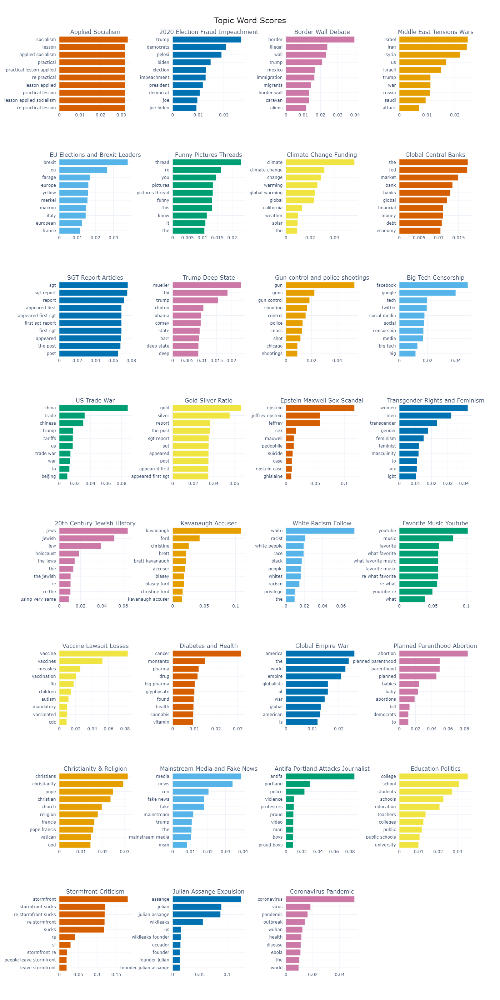
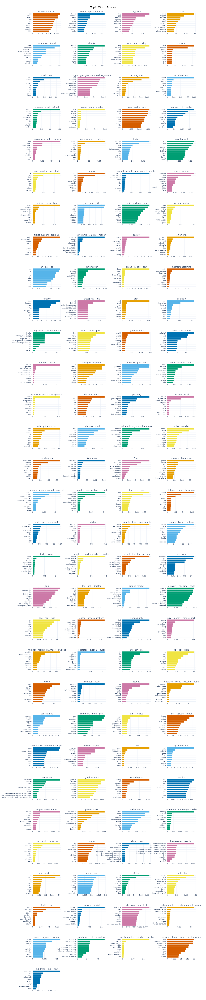
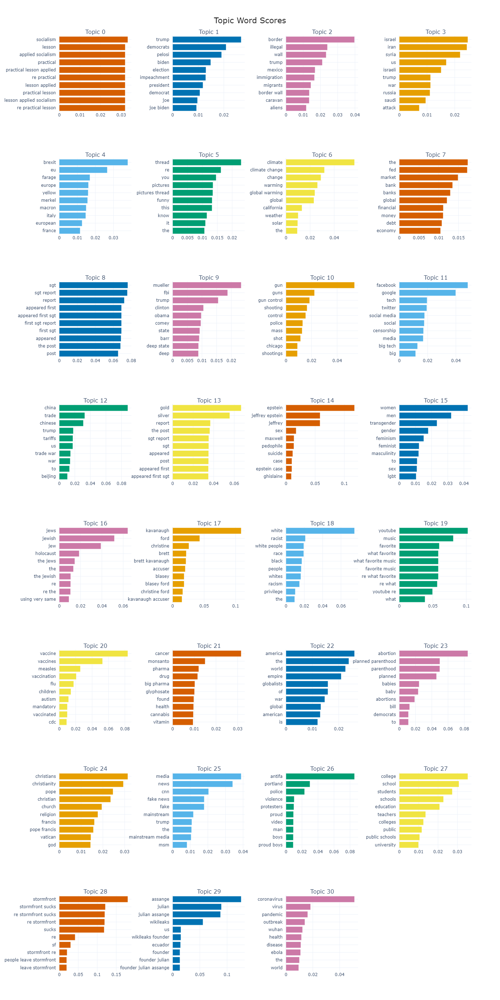
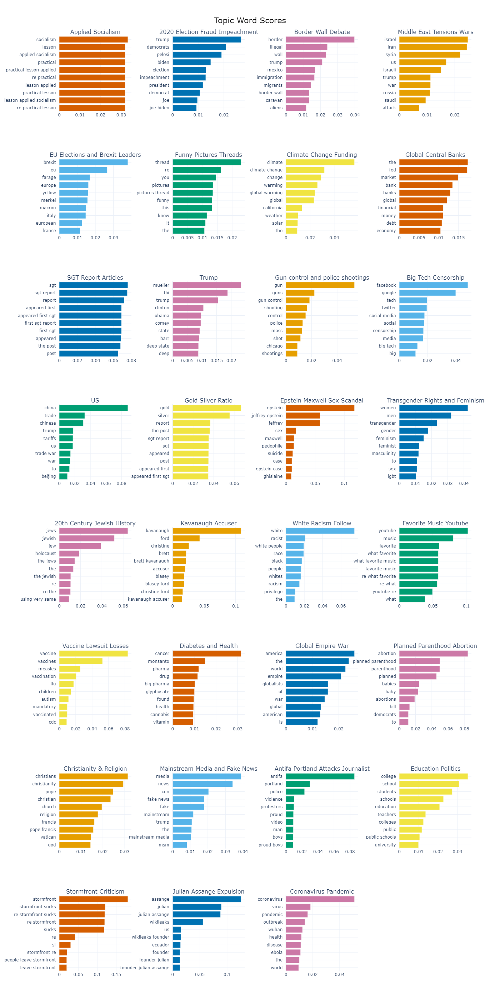
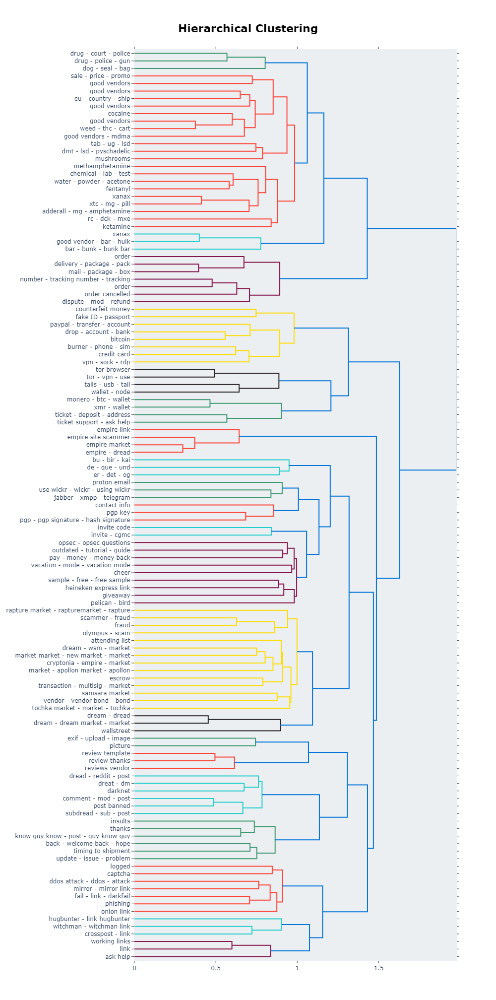

In [134]:
topic_model.visualize_hierarchy(custom_labels=True)

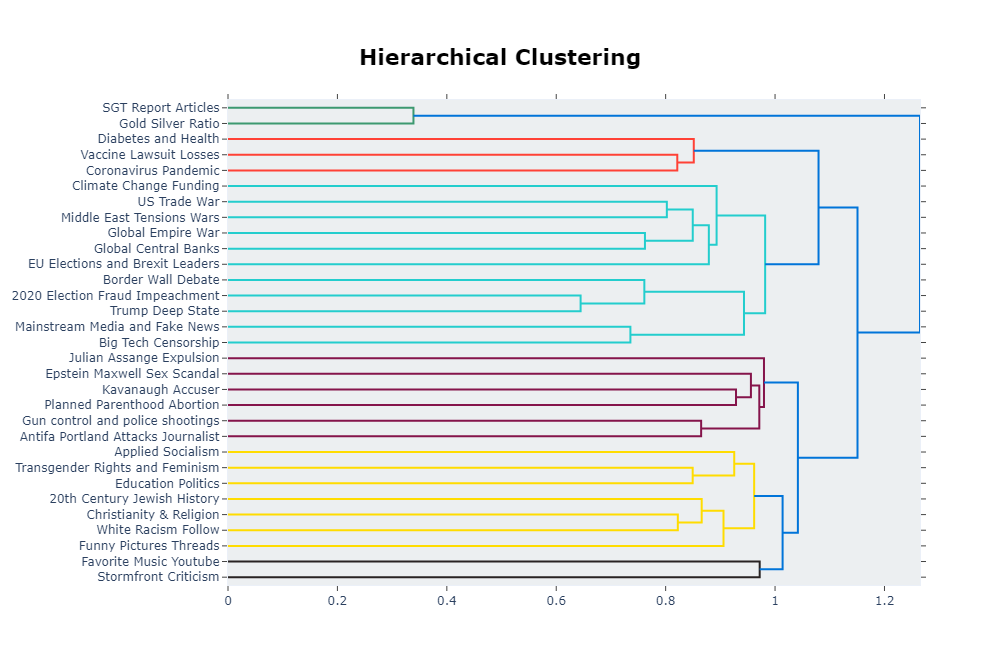
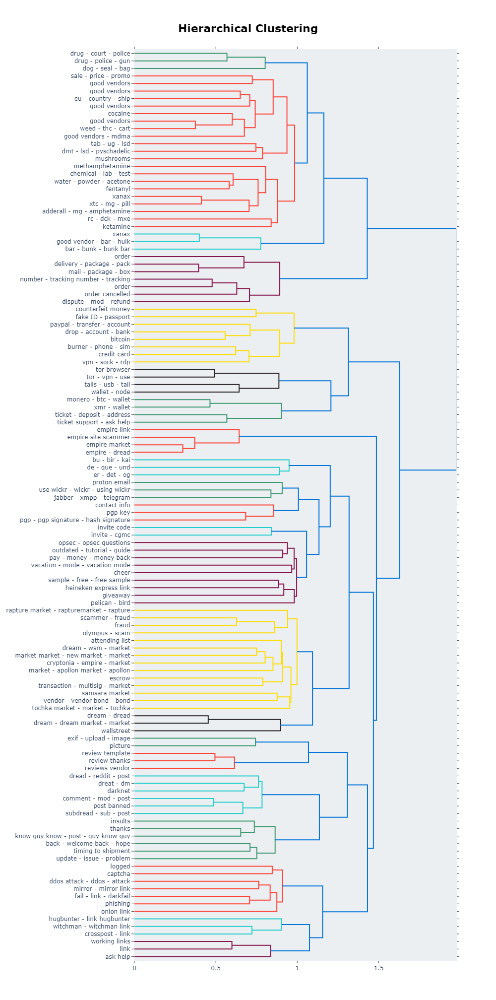
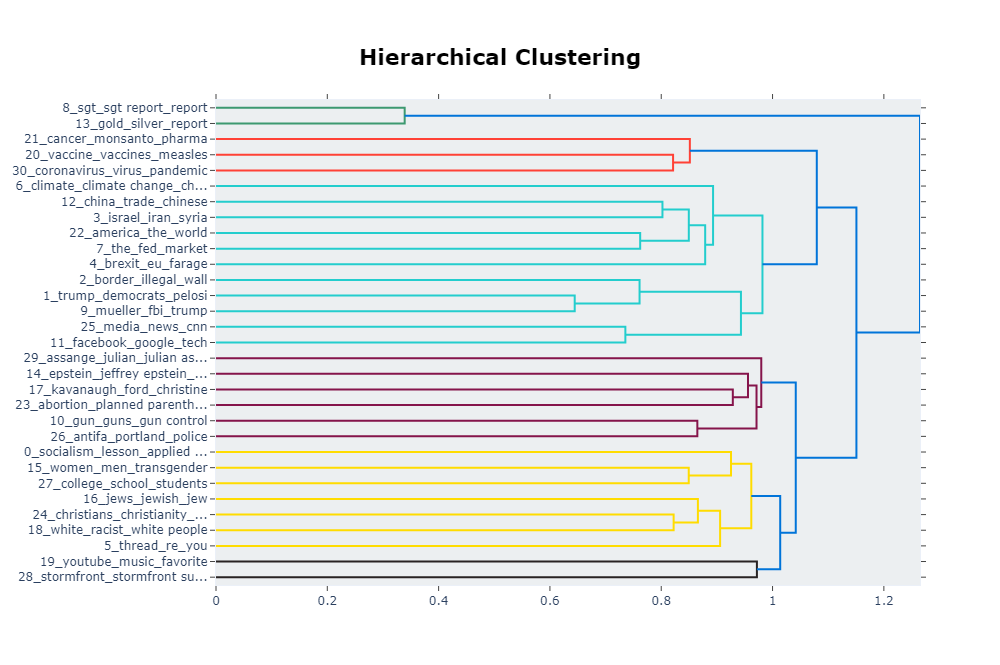
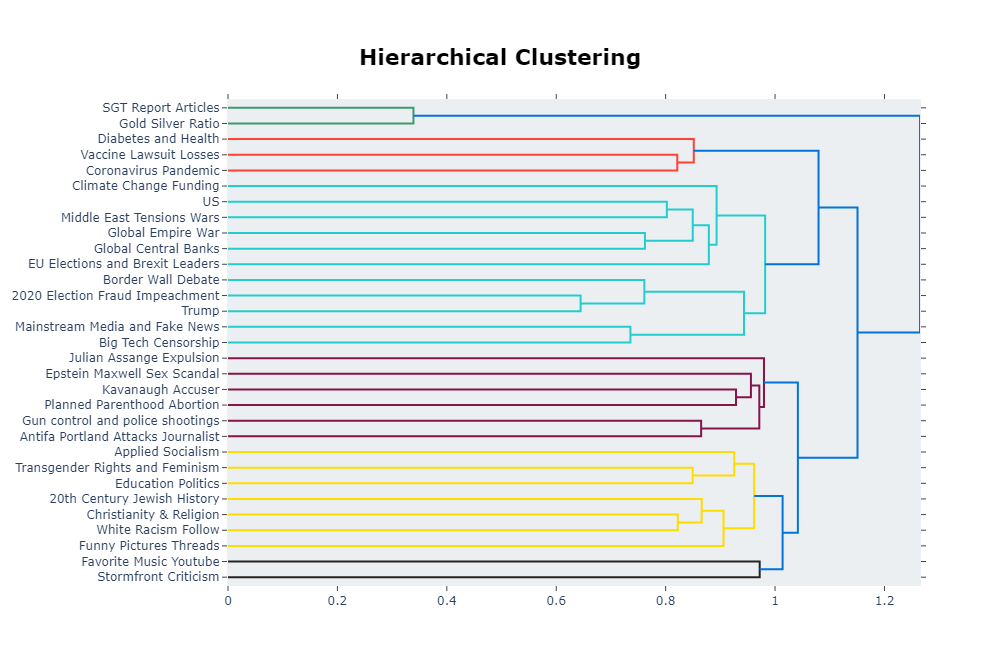
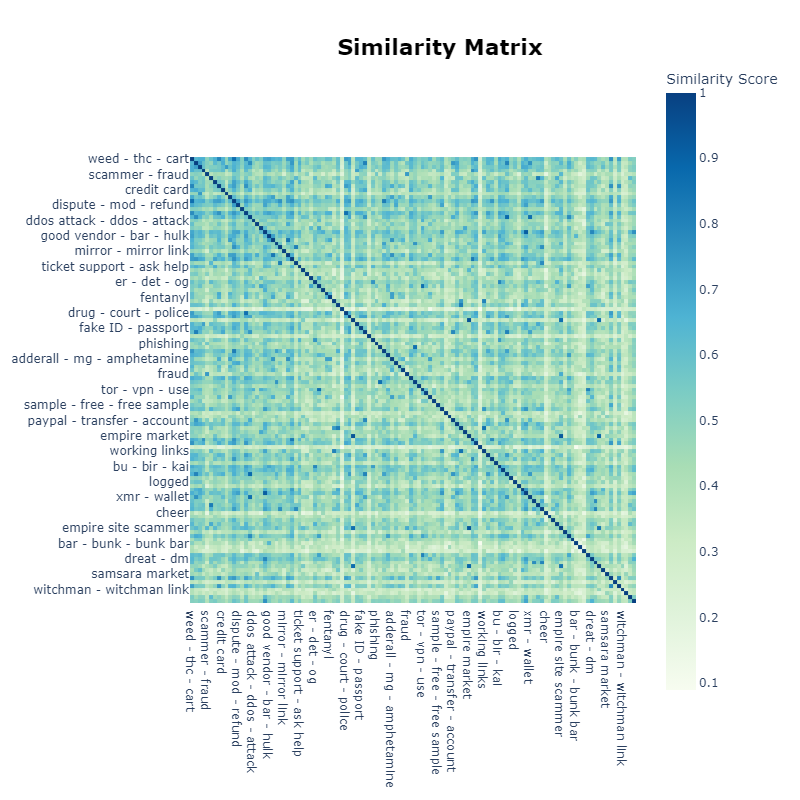

In [135]:
topic_model.visualize_heatmap(custom_labels=True)

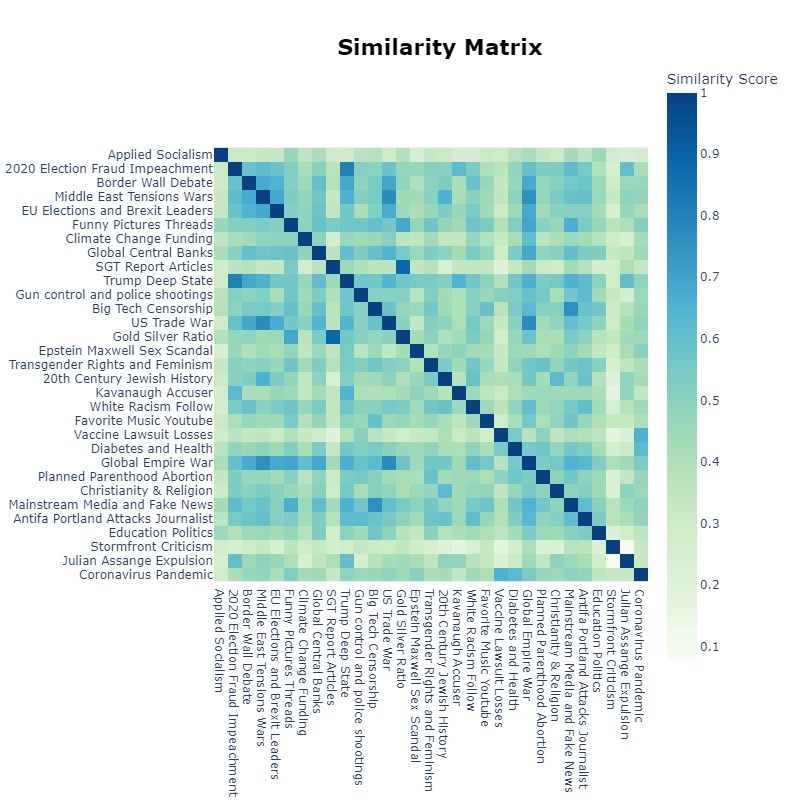
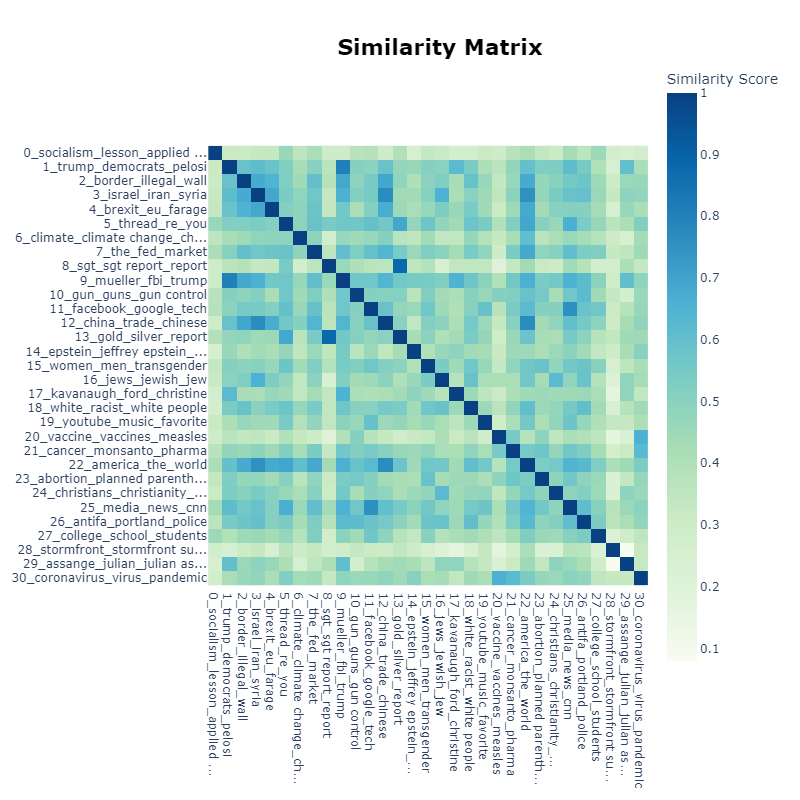
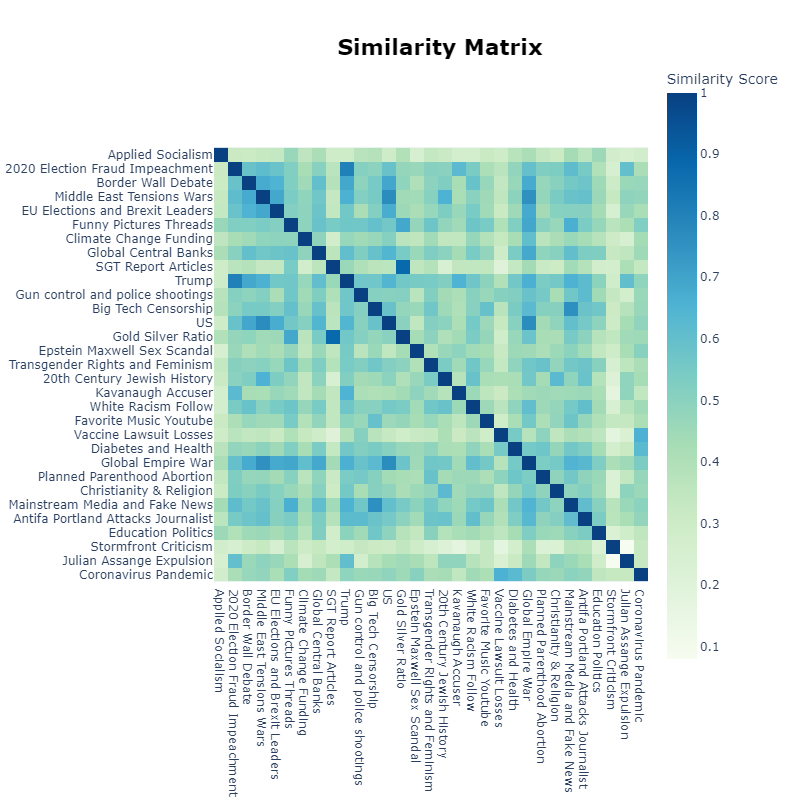
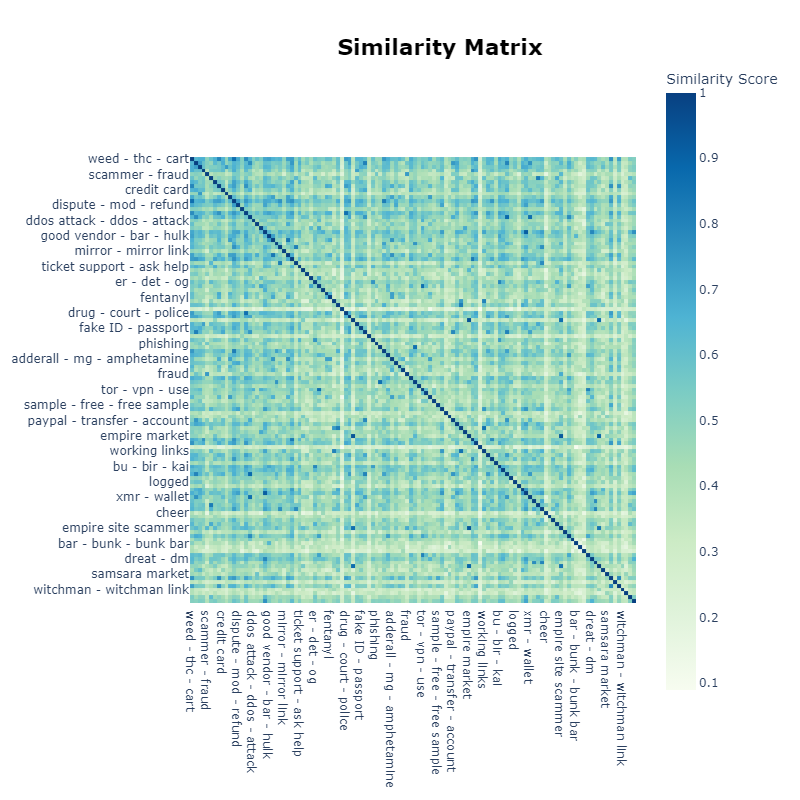

In [8]:
topic_model.visualize_documents(corpus, reduced_embeddings=reduced_embeddings, 
                                hide_document_hover=True, hide_annotations=True, custom_labels=True)

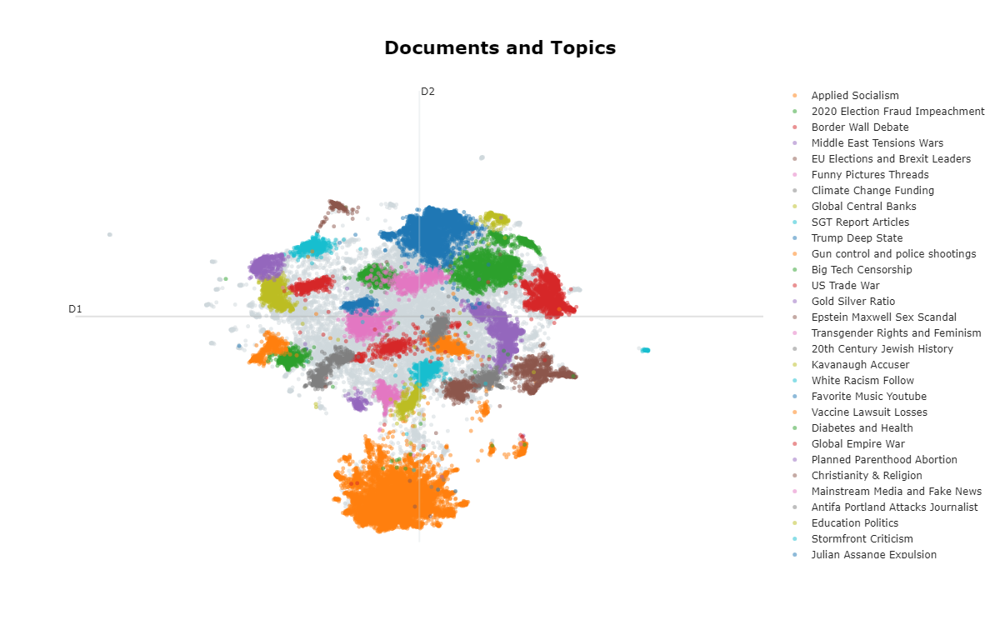

# Evolution Over Time

In [136]:
df = btu.load_data_filtered('../../../Datasets/CleanedData/posts_white_nation_cleaned_content_created_preprocessed.csv', 'content')
df.drop_duplicates(subset='content', inplace=True)
df.dropna(subset=['content'], inplace=True)
created_on = df['created_on'].tolist()

52310


In [137]:
topics_over_time = topic_model.topics_over_time(corpus, created_on, nr_bins=20)
topic_model.visualize_topics_over_time(topics_over_time, top_n_topics=15, width=1250, height=700, custom_labels=True)

20it [02:48,  8.42s/it]


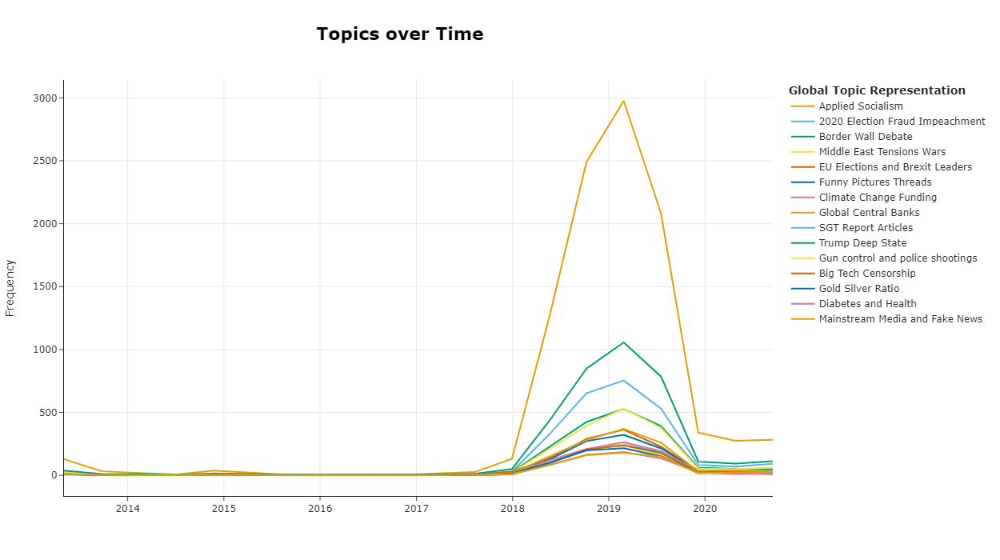
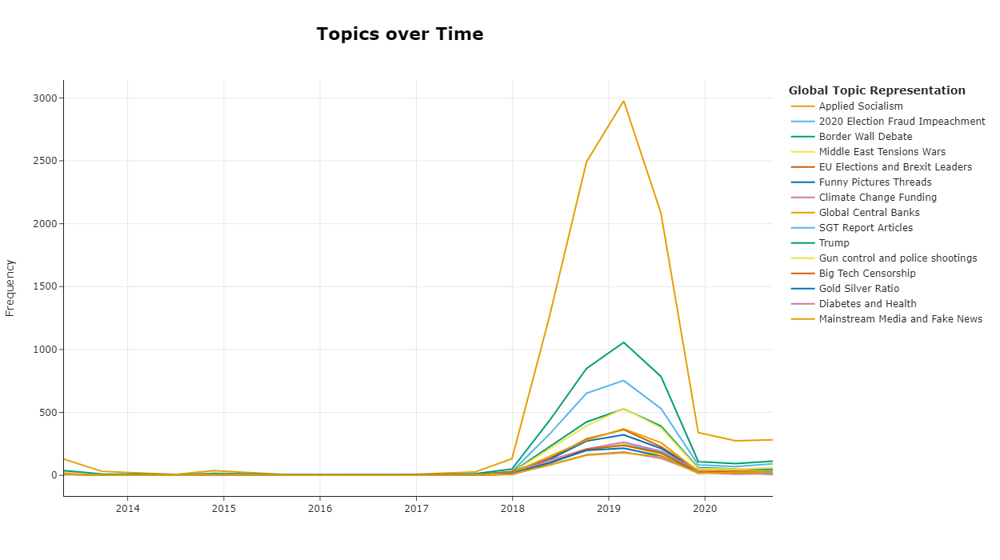
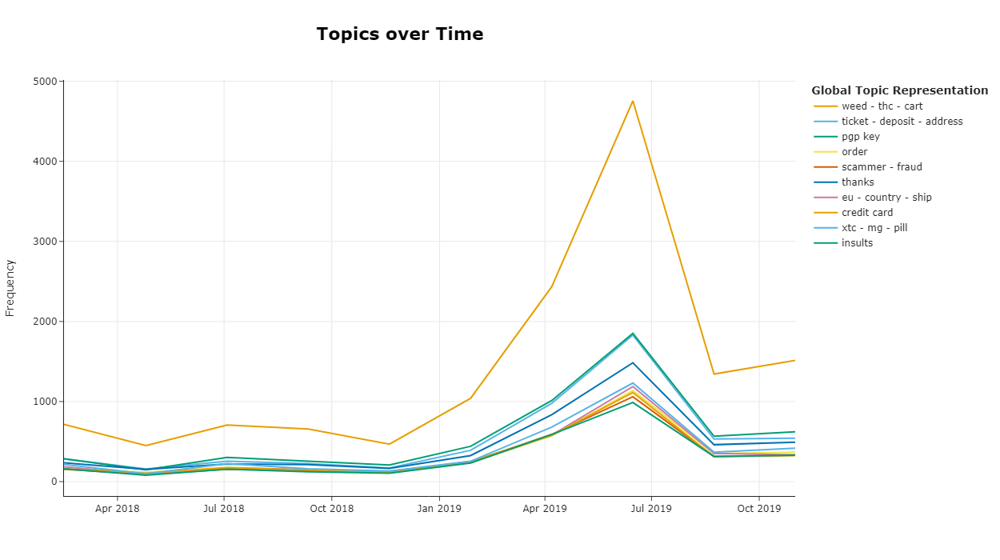

# Save Data

In [138]:
topics_over_time[topics_over_time['Topic'] != -1].sort_values(by=['Topic', 'Timestamp']).to_csv('DatasetsContentBERTopic/BERTopic_all-MiniLM-L6-v2_150_150n_10dim_topics_over_time_20_white_nation.csv', index=False)

In [139]:
topics_over_time = topic_model.topics_over_time(corpus, created_on, nr_bins=10)
topics_over_time[topics_over_time['Topic'] != -1].sort_values(by=['Topic', 'Timestamp']).to_csv('DatasetsContentBERTopic/BERTopic_all-MiniLM-L6-v2_150_150n_10dim_topics_over_time_10_white_nation.csv', index=False)

10it [01:51, 11.10s/it]


In [140]:
results_final = btu.return_dataset(corpus, created_on, embeddings, topic_model.topics_, probs, topic_model, umap_embeddings)
print(results_final.shape)
results_final.head()

(35509, 11)


,Document,Embedding,Topic,Probability,Created_on,Count,Name,CustomName,Representation,Representative_Docs,UMAP_embedding
0,Jason Goodman loaded David Hawkins Patreon Pre...,"[-0.060998008, -0.0013547407, -0.08450357, 0.0...",8,"[4.3054532691231925e-308, 9.041381573968408e-3...",2018-11-05,832,8_sgt_sgt report_report_appeared first,SGT Report Articles,"[sgt, sgt report, report, appeared first, appe...",[Mark Dice loaded It Happening The post It Hap...,"[10.019962, 8.792961, 0.32180685, 4.2927055, 7..."
1,Revealed British Intel Sent Memo Warning US Of...,"[-0.07714215, -0.009344686, -0.034888353, 0.08...",9,"[0.006448335990091314, 0.028645594211870705, 0...",2018-11-09,3596,9_mueller_fbi_trump_clinton,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",[True Pundit A mystery case front United State...,"[10.217353, 8.051011, -0.489887, 3.085789, 6.3..."
2,INDICTMENTS ON HORIZON FROM SPECIAL COUNSEL AF...,"[-0.04173512, 0.018137285, -0.008506534, -0.05...",9,"[0.009922074079458106, 0.05441534983035528, 0....",2018-11-08,3596,9_mueller_fbi_trump_clinton,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",[True Pundit A mystery case front United State...,"[10.212348, 8.0048275, -0.7482794, 2.9405718, ..."
3,Trump Admin Fining Illegals Refusing Leave,"[0.08102418, 0.029327497, -0.019253973, -0.014...",2,"[0.020314429649521314, 0.06388780129157537, 0....",2019-05-16,1802,2_border_illegal_wall_trump,Border Wall Debate,"[border, illegal, wall, trump, mexico, immigra...",[Joe Biden planning dismantle legal wall Unite...,"[10.121845, 6.8956323, -1.2087544, 3.3809812, ..."
4,Even Liberal California Can handle teacher dem...,"[0.028260654, 0.0148315085, 0.02778678, 0.0731...",27,"[0.012575165264700382, 0.016945878528489892, 0...",2018-11-06,374,27_college_school_students_schools,Education Politics,"[college, school, students, schools, education...",[Campus Wokesters Expose The Descent Of Libera...,"[10.153618, 5.990927, -0.25866762, 2.230345, 7..."


In [143]:
results_final.to_parquet('DatasetsContentBERTopic/BERTopic_all-MiniLM-L6-v2_150_150n_10dim_white_nation.parquet')

In [144]:
topic_model.save("ModelsContent/topic_model_all-MiniLM-L6-v2_150_150n_10dim_white_nation", serialization="pickle", save_ctfidf=True, save_embedding_model=model)

2024-08-01 20:36:34,722 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [145]:
topic_model.save("ModelsContent/topic_model_all-MiniLM-L6-v2_150_150n_10dim_white_nation_safetensors", serialization="safetensors", save_ctfidf=True, save_embedding_model=model)

# Example

In [4]:
topic_model = BERTopic.load("ModelsContent/topic_model_all-MiniLM-L6-v2_150_150n_10dim_white_nation", embedding_model='all-MiniLM-L6-v2')

In [148]:
sentence = ['conspirations']
btu.predict_topic(topic_model, sentence, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]
2024-08-01 20:43:30,572 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-01 20:43:34,737 - BERTopic - Dimensionality - Completed ✓
2024-08-01 20:43:34,737 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-01 20:43:34,757 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-01 20:43:34,867 - BERTopic - Probabilities - Completed ✓
2024-08-01 20:43:34,867 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(climate, 0.05677249688199357), (climate chan...",1.750655e-01,Climate Change Funding,"[climate, climate change, change, warming, glo...",conspirations
1,"[(america, 0.025957861855601342), (the, 0.0238...",1.255862e-31,Global Empire War,"[america, the, world, empire, globalists, of, ...",conspirations
2,"[(border, 0.03971644636967441), (illegal, 0.02...",1.772883e-36,Border Wall Debate,"[border, illegal, wall, trump, mexico, immigra...",conspirations
3,"[(abortion, 0.0843202302606633), (planned pare...",6.486559e-44,Planned Parenthood Abortion,"[abortion, planned parenthood, parenthood, pla...",conspirations
4,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",8.058954e-48,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",conspirations


In [149]:
btu.predict_topic(topic_model, ['pandemy'], custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  9.95it/s]
2024-08-01 20:47:40,852 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-01 20:47:43,448 - BERTopic - Dimensionality - Completed ✓
2024-08-01 20:47:43,448 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-01 20:47:43,453 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-01 20:47:43,523 - BERTopic - Probabilities - Completed ✓
2024-08-01 20:47:43,527 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(thread, 0.02300842307310754), (re, 0.0162357...",0.020203,Funny Pictures Threads,"[thread, re, you, pictures, pictures thread, f...",pandemy
1,"[(trump, 0.026758981045864254), (democrats, 0....",0.019858,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",pandemy
2,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",0.018507,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",pandemy
3,"[(youtube, 0.10232523371936059), (music, 0.080...",0.015911,Favorite Music Youtube,"[youtube, music, favorite, what favorite, what...",pandemy
4,"[(america, 0.025957861855601342), (the, 0.0238...",0.015236,Global Empire War,"[america, the, world, empire, globalists, of, ...",pandemy


In [150]:
btu.predict_topic(topic_model, ['virus'], custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]
2024-08-01 20:47:56,618 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-01 20:47:58,464 - BERTopic - Dimensionality - Completed ✓
2024-08-01 20:47:58,467 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-01 20:47:58,467 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-01 20:47:58,532 - BERTopic - Probabilities - Completed ✓
2024-08-01 20:47:58,537 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(coronavirus, 0.05107391686287775), (virus, 0...",1.0,Coronavirus Pandemic,"[coronavirus, virus, pandemic, outbreak, wuhan...",virus
1,"[(epstein, 0.11743330923356197), (jeffrey epst...",0.0,Epstein Maxwell Sex Scandal,"[epstein, jeffrey epstein, jeffrey, sex, maxwe...",virus
2,"[(trump, 0.026758981045864254), (democrats, 0....",0.0,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",virus
3,"[(border, 0.03971644636967441), (illegal, 0.02...",0.0,Border Wall Debate,"[border, illegal, wall, trump, mexico, immigra...",virus
4,"[(israel, 0.024715953727969902), (iran, 0.0243...",0.0,Middle East Tensions Wars,"[israel, iran, syria, us, israeli, trump, war,...",virus


In [151]:
btu.predict_topic(topic_model, ['scandal'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 11.75it/s]
2024-08-01 20:48:16,243 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-01 20:48:18,258 - BERTopic - Dimensionality - Completed ✓
2024-08-01 20:48:18,259 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-01 20:48:18,263 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-01 20:48:18,318 - BERTopic - Probabilities - Completed ✓
2024-08-01 20:48:18,323 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(assange, 0.1258236681252748), (julian, 0.089...",0.654764,Julian Assange Expulsion,"[assange, julian, julian assange, wikileaks, u...",scandal
1,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",0.000032,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",scandal
2,"[(israel, 0.024715953727969902), (iran, 0.0243...",0.000008,Middle East Tensions Wars,"[israel, iran, syria, us, israeli, trump, war,...",scandal


In [152]:
btu.predict_topic(topic_model, ['elections'], num_classes=1, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]
2024-08-01 20:49:21,793 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-01 20:49:24,761 - BERTopic - Dimensionality - Completed ✓
2024-08-01 20:49:24,769 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-01 20:49:24,771 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-01 20:49:24,855 - BERTopic - Probabilities - Completed ✓
2024-08-01 20:49:24,855 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(trump, 0.026758981045864254), (democrats, 0....",0.977469,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",elections


In [153]:
btu.predict_topic(topic_model, ['Eu'], num_classes=1, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]
2024-08-01 20:50:05,120 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-01 20:50:06,932 - BERTopic - Dimensionality - Completed ✓
2024-08-01 20:50:06,932 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-01 20:50:06,940 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-01 20:50:07,008 - BERTopic - Probabilities - Completed ✓
2024-08-01 20:50:07,013 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(brexit, 0.03797234101764251), (eu, 0.0265756...",0.04062,EU Elections and Brexit Leaders,"[brexit, eu, farage, europe, yellow, merkel, m...",Eu


In [155]:
btu.predict_topic(topic_model, ['Racism'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 13.32it/s]
2024-08-01 20:54:11,753 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-01 20:54:13,328 - BERTopic - Dimensionality - Completed ✓
2024-08-01 20:54:13,328 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-01 20:54:13,362 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-01 20:54:13,484 - BERTopic - Probabilities - Completed ✓
2024-08-01 20:54:13,484 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(white, 0.07472315534093334), (racist, 0.0211...",0.327285,White Racism Follow,"[white, racist, white people, race, black, peo...",Racism
1,"[(college, 0.03536033687772518), (school, 0.03...",0.093827,Education Politics,"[college, school, students, schools, education...",Racism
2,"[(women, 0.04240462505747959), (men, 0.0321306...",0.027842,Transgender Rights and Feminism,"[women, men, transgender, gender, feminism, fe...",Racism


In [158]:
btu.predict_topic(topic_model, ['police abuse'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 11.14it/s]
2024-08-01 20:57:22,947 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-01 20:57:25,440 - BERTopic - Dimensionality - Completed ✓
2024-08-01 20:57:25,443 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-01 20:57:25,449 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-01 20:57:25,693 - BERTopic - Probabilities - Completed ✓
2024-08-01 20:57:25,695 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(antifa, 0.08558154706448108), (portland, 0.0...",3.725467e-01,Antifa Portland Attacks Journalist,"[antifa, portland, police, violence, protester...",police abuse
1,"[(gun, 0.05355233111955208), (guns, 0.02225620...",2.498225e-01,Gun control and police shootings,"[gun, guns, gun control, shooting, control, po...",police abuse
2,"[(white, 0.07472315534093334), (racist, 0.0211...",8.118123e-09,White Racism Follow,"[white, racist, white people, race, black, peo...",police abuse
